In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv("info.csv")

In [5]:
df.head(1)

,Source.Name,Symbol,Series,Date,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty
0,01-01-2019-TO-31-12-2019-INFY-ALL-N.csv,INFY,EQ,1/1/2019,658.95,660.95,666.3,654.15,665.95,665.05,660.66,2943390,1.944579e+09,45422,"12,82,161",43.56


In [7]:
df= df.drop(df.iloc[:,0:3], axis=1)    #drop unused columns
df.head(1)

,Date,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty
0,1/1/2019,658.95,660.95,666.3,654.15,665.95,665.05,660.66,2943390,1.944579e+09,45422,"12,82,161",43.56


In [9]:
df.isnull().sum()

Date                        0
Prev Close                  0
Open Price                  0
High Price                  0
Low Price                   0
Last Price                  0
Close Price                 0
Average Price               0
Total Traded Quantity       0
Turnover ₹                  0
No. of Trades               0
Deliverable Qty             0
% Dly Qt to Traded Qty      0
dtype: int64

In [11]:
df.dropna(inplace=True)

In [13]:
df.describe()

,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades
count,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1.410000e+03,1.410000e+03,1.410000e+03
mean,1262.228298,1263.513688,1275.683156,1251.102730,1263.684113,1263.446170,1263.531071,7.870400e+06,9.385751e+09,1.978400e+05
std,380.390639,380.749279,382.989000,377.634851,380.349680,380.403975,380.290560,5.881152e+06,6.304054e+09,1.154285e+05
min,526.450000,509.250000,558.000000,509.250000,529.150000,526.450000,531.330000,1.329350e+05,2.077310e+08,1.000000e+00
25%,792.662500,790.075000,799.087500,784.150000,791.775000,792.700000,792.602500,4.853546e+06,5.862836e+09,1.371490e+05
50%,1389.000000,1391.025000,1400.000000,1377.575000,1389.875000,1389.150000,1389.155000,6.560704e+06,8.007865e+09,1.740570e+05
75%,1549.275000,1548.675000,1565.987500,1536.037500,1548.000000,1550.500000,1548.255000,8.875105e+06,1.087626e+10,2.302045e+05
max,1939.500000,1938.550000,1953.900000,1930.500000,1938.600000,1939.500000,1941.460000,9.043339e+07,8.323905e+10,1.643015e+06


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1410 entries, 0 to 1409
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      1410 non-null   object 
 1   Prev Close                1410 non-null   float64
 2   Open Price                1410 non-null   float64
 3   High Price                1410 non-null   float64
 4   Low Price                 1410 non-null   float64
 5   Last Price                1410 non-null   float64
 6   Close Price               1410 non-null   float64
 7   Average Price             1410 non-null   float64
 8   Total Traded Quantity     1410 non-null   int64  
 9   Turnover ₹                1410 non-null   float64
 10  No. of Trades             1410 non-null   int64  
 11  Deliverable Qty           1410 non-null   object 
 12  % Dly Qt to Traded Qty    1410 non-null   object 
dtypes: float64(8), int64(2), object(3)
memory usage: 143.3+ KB


In [17]:
df.columns

Index(['Date  ', 'Prev Close  ', 'Open Price  ', 'High Price  ', 'Low Price  ',
       'Last Price  ', 'Close Price  ', 'Average Price ',
       'Total Traded Quantity  ', 'Turnover ₹  ', 'No. of Trades  ',
       'Deliverable Qty  ', '% Dly Qt to Traded Qty  '],
      dtype='object')

In [19]:
df[df.duplicated()].value_counts().sum()

14

In [21]:
df.drop_duplicates(inplace=True)

In [23]:
df.rename(columns=lambda x: x.strip(), inplace=True)
df.columns

Index(['Date', 'Prev Close', 'Open Price', 'High Price', 'Low Price',
       'Last Price', 'Close Price', 'Average Price', 'Total Traded Quantity',
       'Turnover ₹', 'No. of Trades', 'Deliverable Qty',
       '% Dly Qt to Traded Qty'],
      dtype='object')

In [25]:
df.set_index('Date', inplace=True)

In [516]:
df.agg({
    'Open Price':['max','min'],
    'High Price':['max','min'],
    'Low Price':['max','min'],
    'Close Price':['max','min'],
    'Average Price':['max','min']
})

,Open Price,High Price,Low Price,Close Price,Average Price
max,1938.55,1953.9,1930.50,1939.50,1941.46
min,509.25,558.0,509.25,526.45,531.33


In [518]:
df.agg({
    'Total Traded Quantity':['max','min'],
    'Turnover ₹':['max','min'],
    'No. of Trades':['max','min'],
    'Deliverable Qty':['max','min'],
    '% Dly Qt to Traded Qty':['max','min']
})

,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty
max,90433393,8.323905e+10,1643015,"99,64,000",79.52
min,132935,2.077310e+08,1,-,-


In [520]:
from ydata_profiling import ProfileReport

In [522]:
info = ProfileReport(df,title = 'Infosys_stock',dark_mode = True,sensitive=True,explorative=True)
info

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

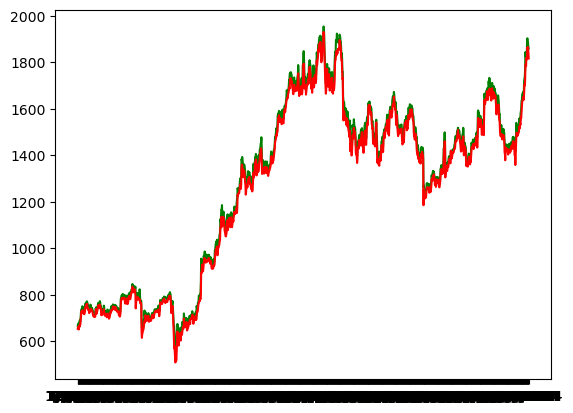

In [29]:
plt.plot(df.index,df['High Price'],color = 'green')
plt.plot(df.index,df['Low Price'],color = 'red')
plt.show()

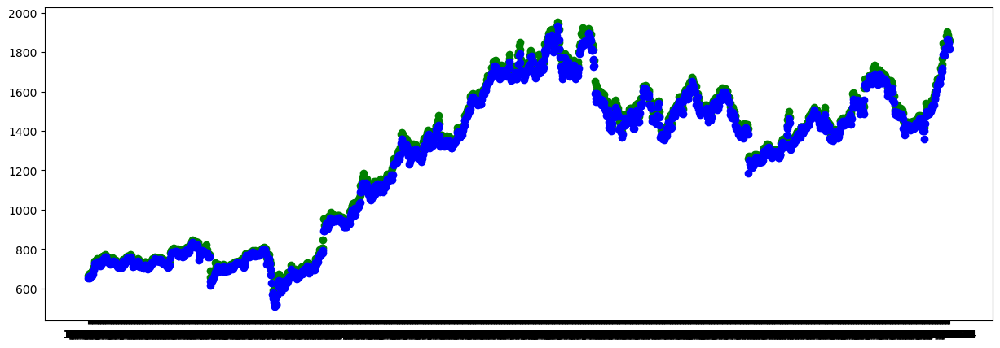

In [31]:
plt.figure(figsize = (15,5))
plt.scatter(df.index,df['High Price'],color = 'green')
plt.scatter(df.index,df['Low Price'],color = 'blue')

In [32]:
import plotly.express as px

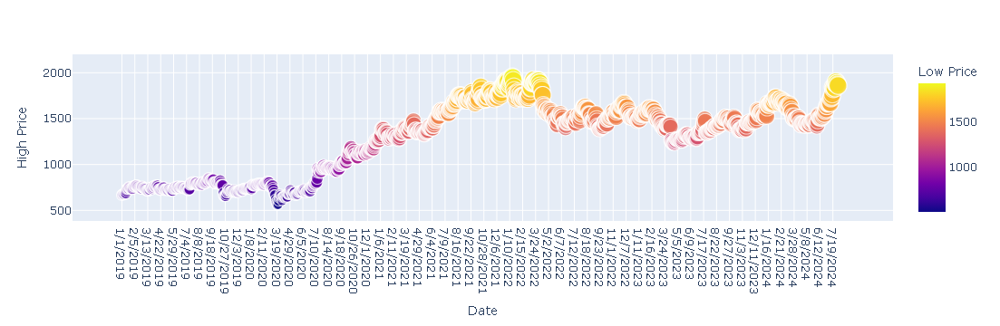

In [35]:
fig = px.scatter(df, x=df.index, y="High Price",
                 color = 'Low Price',size= 'Average Price')

fig.show()

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



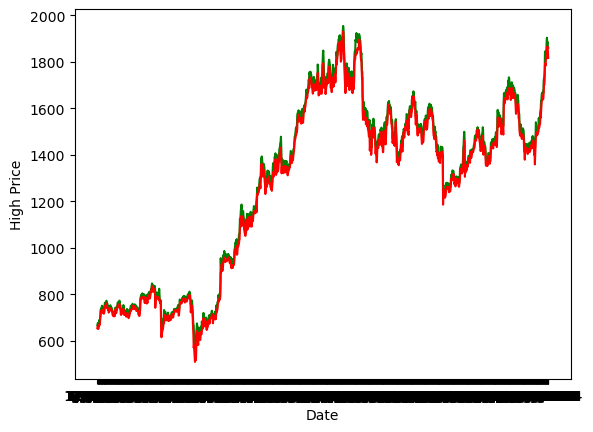

In [37]:
sns.lineplot(data=df, x=df.index, y='High Price',color = 'green')
sns.lineplot(data=df, x=df.index, y='Low Price',color = 'red')
plt.show()

In [39]:
import plotly.offline as pyo
import plotly.graph_objs as go

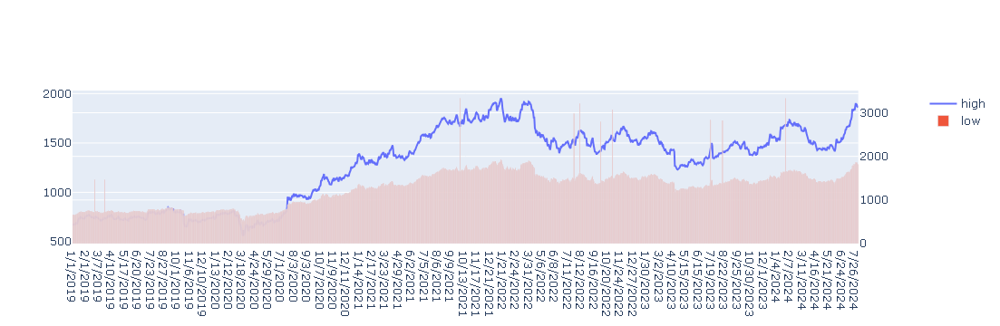

In [41]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=df.index,y=df['High Price'],name='high'),secondary_y=False)
fig.add_trace(go.Bar(x=df.index,y=df['Low Price'],name='low'),secondary_y=True)
fig.show()

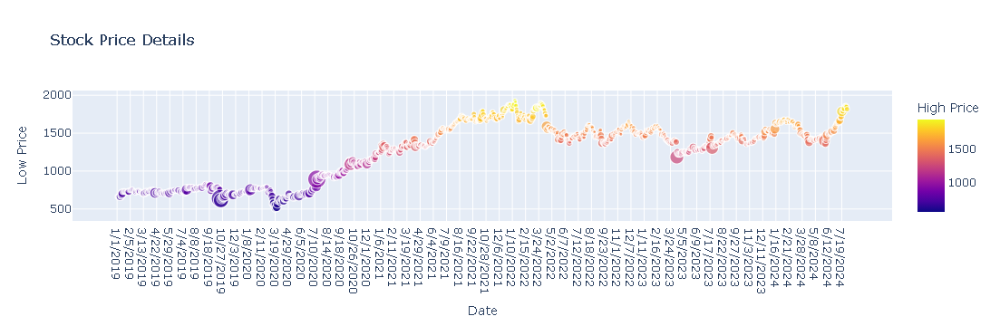

In [43]:
fig = px.scatter(df, x=df.index, y="Low Price", 
                 color="High Price", 
                size=df['Total Traded Quantity'],
                hover_data=['Total Traded Quantity'],
                 title = "Stock Price Details") 
  
fig.show()

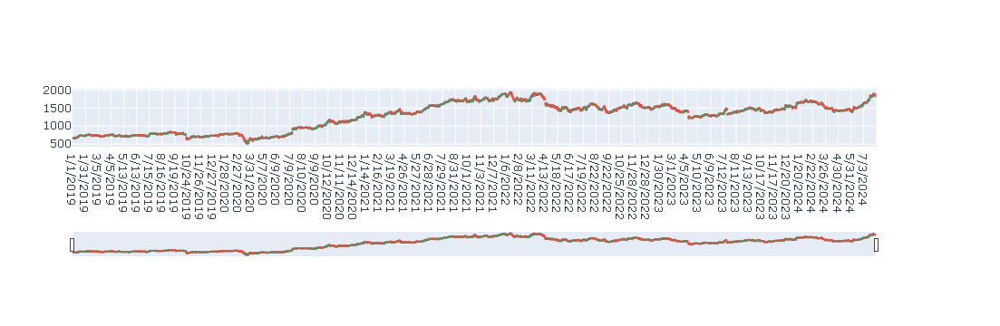

In [45]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Candlestick(x=df.index,
                              open=df['Open Price'],
                              high=df['High Price'],
                              low=df['Low Price'],
                              close=df['Close Price'],
                             ))

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



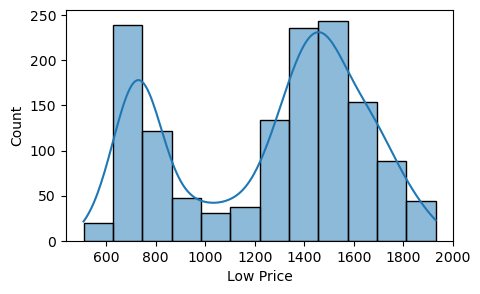

In [47]:
plt.figure(figsize =  (5,3))
sns.histplot(data = df,x = 'Low Price',kde = True)
plt.show()

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed

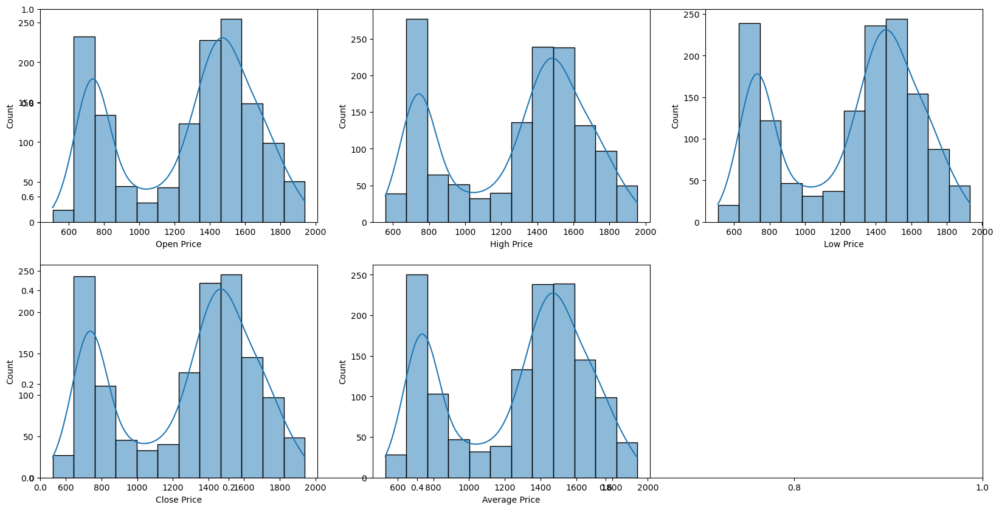

In [49]:
features = ['Open Price', 'High Price', 'Low Price', 'Close Price','Average Price']
  
plt.subplots(figsize=(20,10)) 
  
for i, col in enumerate(features): 
  plt.subplot(2,3,i+1) 
  sns.histplot(df[col],kde=True) 
plt.show()

In [53]:
d1 = df.sample(100)

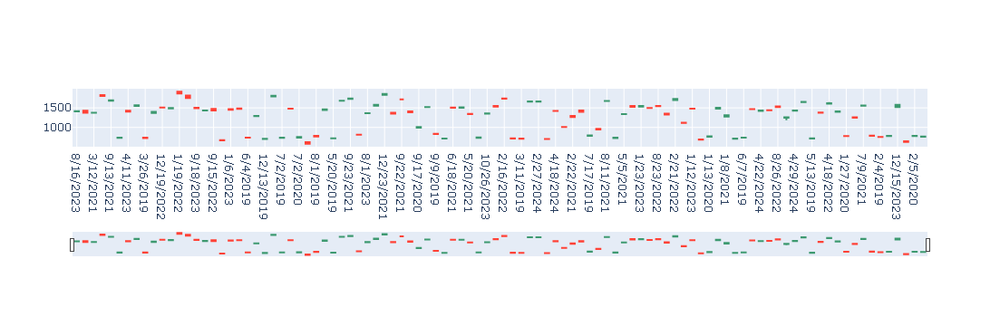

In [55]:
from datetime import datetime

fig = go.Figure(data=[go.Candlestick(x=d1.index,
                open=d1['Open Price'],
                high=d1['High Price'],
                low=d1['Low Price'],
                close=d1['Close Price'])])

fig.show()

In [59]:
t = df

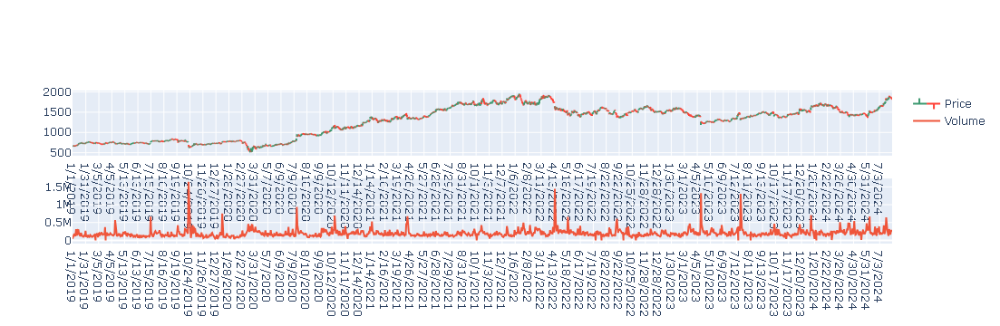

In [61]:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Ohlc(x= t.index,
                      open=t['Open Price'],
                      high=t['High Price'],
                      low=t['Low Price'],
                      close=t['Close Price'],
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=t.index, y=t['No. of Trades'], name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

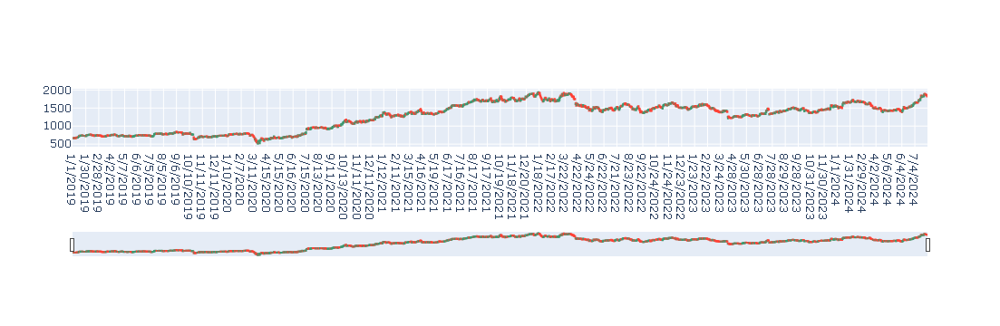

In [63]:
fig = go.Figure(data=[go.Candlestick(x=df.index,
                open=df['Open Price'],
                high=df['High Price'],
                low=df['Low Price'],
                close=df['Close Price'])])

fig.show()

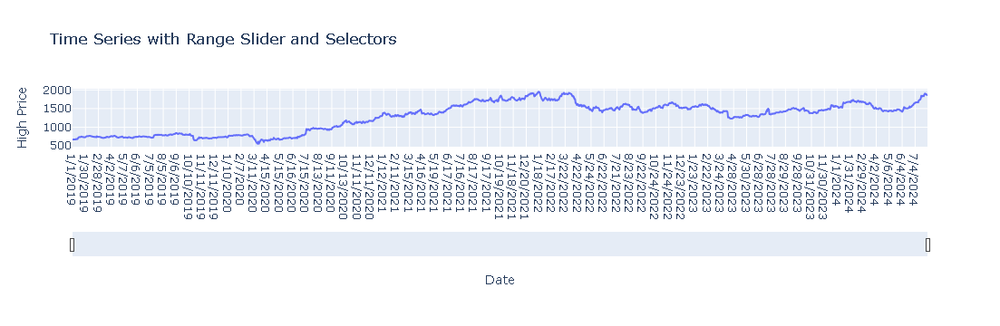

In [65]:
fig = px.line(df, x=df.index, y='High Price', title='Time Series with Range Slider and Selectors')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [532]:
w = df.sample(20)

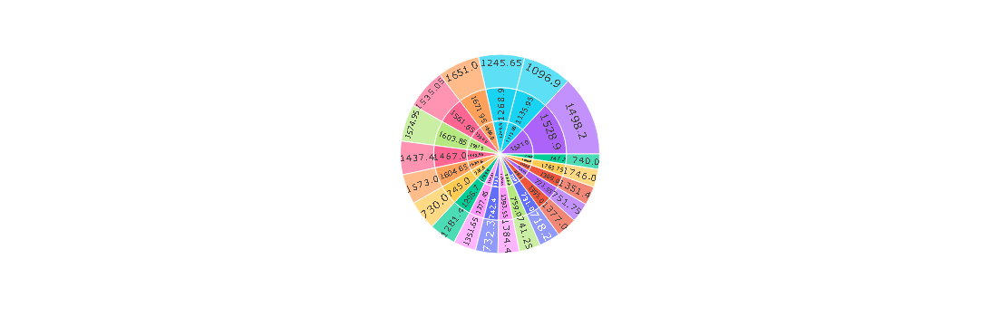

In [536]:
fig = px.sunburst(w, path=['Open Price','High Price','Low Price'], values='No. of Trades', color='Deliverable Qty')
fig.show()

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\categorical.py:486: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\Vishal\AppData\Local\Temp\ipykernel_23832\3134512901.py:10: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\Vishal\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Vishal\anaconda3\Lib\site-pa

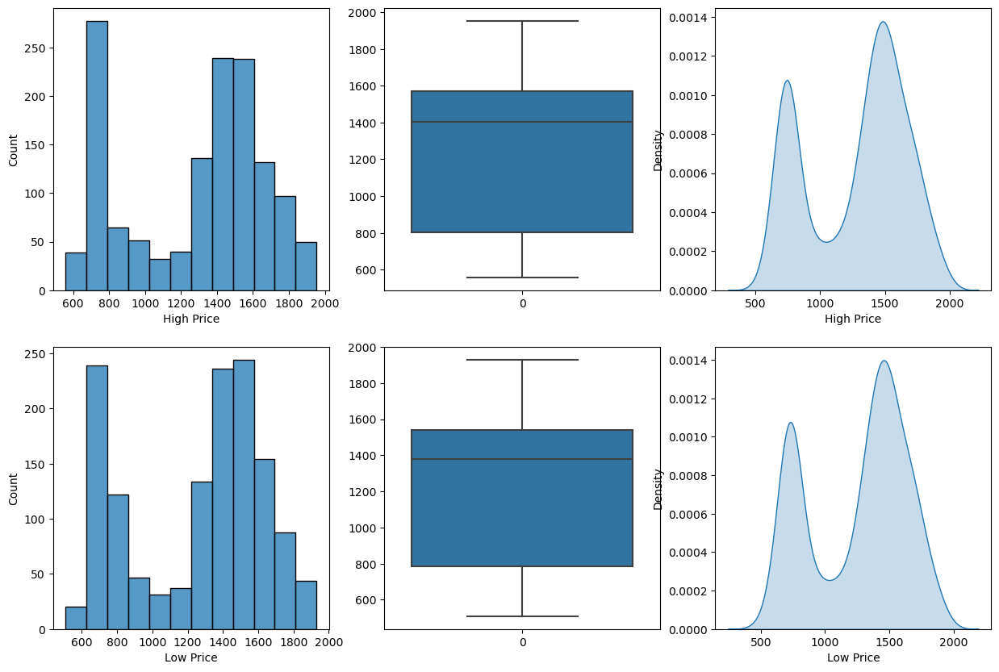

In [67]:
plt.figure(figsize = (15,10))

plt.subplot(2,3,1)
sns.histplot(df['High Price'])

plt.subplot(2,3,2)
sns.boxplot(df['High Price'])

plt.subplot(2,3,3)
sns.kdeplot(df['High Price'],shade = True)


plt.subplot(2,3,4)
sns.histplot(df['Low Price'])


plt.subplot(2,3,5)
sns.boxplot(df['Low Price'])

plt.subplot(2,3,6)
sns.kdeplot(df['Low Price'],shade = True)


plt.show()

Linear Regression

Linear regression is a type of supervised machine learning algorithm that computes the linear relationship between the dependent variable and one or more independent features by fitting a linear equation to observed data.

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression , LogisticRegression,LogisticRegressionCV
from sklearn.svm import SVC
from xgboost import XGBClassifier
from matplotlib import style
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from datetime import datetime, timedelta

In [71]:
X = df.iloc[:,[3,4]]
X.head(1)

,Low Price,Last Price
Date,,
1/1/2019,654.15,665.95


In [73]:
y = df.iloc[:,7]
y.head(1)

Date
1/1/2019    2943390
Name: Total Traded Quantity, dtype: int64

In [75]:
X_train,X_test,y_train,y_test =train_test_split(X,y,test_size=0.25,random_state=0)

In [77]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1047, 2)
(349, 2)
(1047,)
(349,)


In [79]:
regressor=LinearRegression()

In [81]:
regressor.fit(X_train,y_train)

LinearRegression()

In [83]:
print(regressor.coef_)

print(regressor.intercept_)

[-162393.76705754  157353.84028233]
12151502.319036413


In [85]:
predicted=regressor.predict(X_test)
print(predicted)

[ 9134579.49155531  9193898.89854699  5034279.91442862  9654436.62221986
  9007911.65602456  7157744.0784571   8862148.8169585   8998307.02086307
  8709731.98030579  9494030.90939425  9138301.88805952 10937606.37801552
  7694480.5924351   6604468.24343484  7301856.35212906  6250522.39762633
 10115157.47745594  5460866.99714434  5703454.89156958 22205362.03636031
 12209955.06612842  7374886.45711565  8859859.87824636  5277182.6104075
  9640481.75795524 11102585.45966318  6701988.19821626  8973875.57745586
  5079389.00213139  9592678.31806864  9482843.66091625  9529510.07377625
  8834971.53235091  8370010.42574714  5413388.78975557 10920870.81125757
  5345602.65988317 10032173.01957368  7228017.05348872 10945174.09824738
  4732998.67510221  4590537.90696603  5636804.04565916  7883434.2698892
  7236133.2557123   9249608.40531377  9028027.81395288  4471404.67343879
  4900737.56991114  9140661.4071681   4862116.72399078  7107323.89392919
  9964697.29242771  6417718.89744795  7927098.5287140

In [87]:
dfr=pd.DataFrame({'Actual':y_test,'Predicted':predicted})

In [89]:
dfr.head(1)

,Actual,Predicted
Date,,
8/8/2019,8009009,9.134579e+06


In [91]:
dfr.sort_values("Predicted",ascending=False)

,Actual,Predicted
Date,,
3/13/2020,16903140,2.220536e+07
4/17/2023,53171705,1.777466e+07
3/19/2020,16584106,1.628033e+07
3/20/2020,21356183,1.456656e+07
10/11/2019,20636344,1.427988e+07
...,...,...
2/5/2024,3634135,3.919000e+06
1/17/2022,5262464,3.696490e+06
11/4/2021,483407,3.637104e+06


In [93]:
lst=[i for i in range(0,len(dfr.Actual))]
ak=dfr.head(len(dfr.Actual))
aka=ak.sort_values("Actual")

In [95]:
aka

,Actual,Predicted
Date,,
5/18/2024,318277,5.245842e+06
11/4/2021,483407,3.637104e+06
11/12/2023,572298,6.604468e+06
11/14/2020,1136144,6.907167e+06
2/25/2019,1263230,8.447408e+06
...,...,...
1/12/2024,26754401,1.369069e+07
4/18/2022,30523965,9.220548e+06
4/17/2023,53171705,1.777466e+07


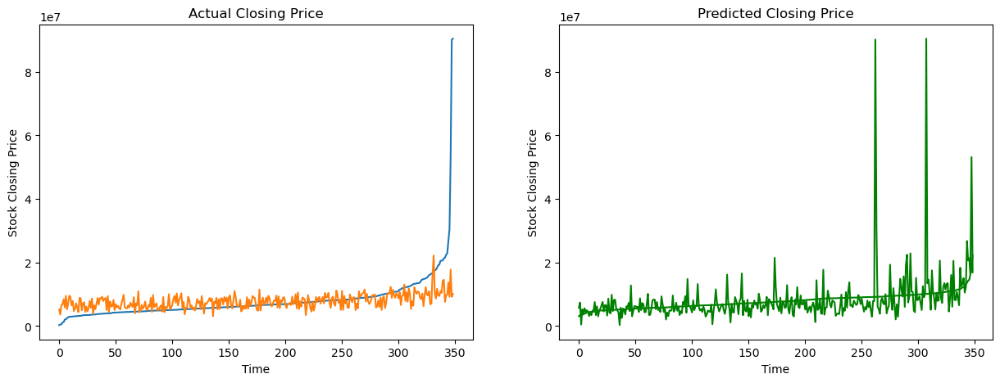

In [97]:
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
plt.plot(lst,aka)
plt.xlabel("Time")
plt.ylabel("Stock Closing Price")
plt.title("Actual Closing Price")
#plt.plot(lst,aak,color="Blue")
#df_new['Close'].plot(figsize=(16,6))

plt.subplot(1,2,2)
lst=[i for i in range(0,len(dfr.Actual))]
aak=ak.sort_values("Predicted")
plt.plot(lst,aak,color="green")
plt.xlabel("Time")
plt.ylabel("Stock Closing Price")
plt.title("Predicted Closing Price")
plt.show()




plt.show()

In [99]:
# Rolling Mean / Moving Average to remove the noise in the graph and smoothen it

close_col = df['High Price']
mvag = close_col.rolling(window=100).mean()     # Taking an average over the window size of 100.
# Increasing the window size can make it more smoother, but less informative and vice-versa.

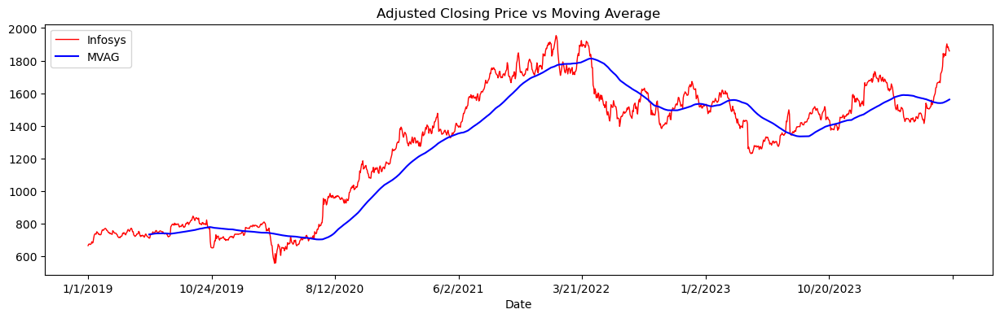

In [101]:
df['High Price'].plot(label='Infosys', figsize=(15,4), title='Adjusted Closing Price vs Moving Average', color='red', linewidth=1.0, grid=True)
mvag.plot(label='MVAG', color='blue')
plt.legend()

In [103]:
h = df.sample(500)

In [105]:
h.shape

(500, 12)

In [107]:
#we'll use Close variable only
u = h[["Close Price"]]

In [109]:
u

,Close Price
Date,
12/30/2021,1892.85
10/21/2021,1753.65
2/5/2024,1687.20
6/18/2021,1503.30
12/6/2022,1612.90
...,...
8/10/2021,1677.25
8/21/2023,1405.40
6/6/2024,1472.25


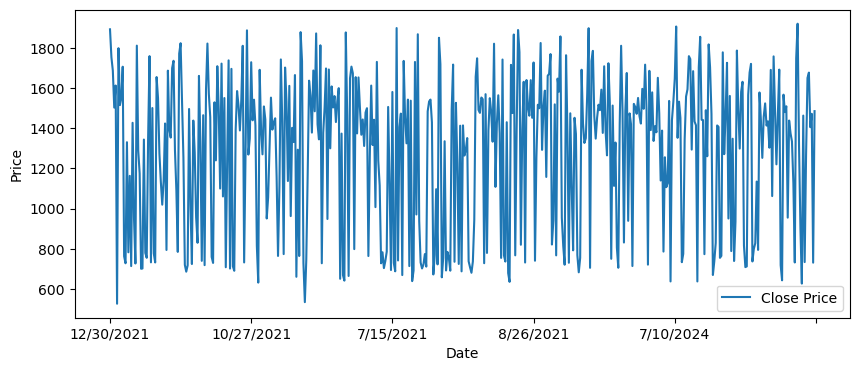

In [111]:
#Let's plot the original price and see the trend
#The graph shows that the price movement is in uptrend
#Thus, it met Mr Z's requirement


u.plot.line(y="Close Price",use_index=True,figsize=(10,4))
plt.ylabel('Price')
plt.show()

Pandas Technical Analysis (Pandas TA) is an easy to use library that leverages the Pandas package with more than 130 Indicators and Utility functions and more than 60 TA Lib Candlestick Patterns.

In [113]:
import pandas_ta

#EMA calculated over 10-days period, length = 10 and append into existing dataframe
u.ta.ema(close="Close Price",length=10,append=True)

C:\Users\Vishal\AppData\Local\Temp\ipykernel_23832\2200018595.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Date
12/30/2021            NaN
10/21/2021            NaN
2/5/2024              NaN
6/18/2021             NaN
12/6/2022             NaN
                 ...     
8/10/2021     1328.486492
8/21/2023     1342.470766
6/6/2024      1366.066991
1/18/2019     1250.591174
10/19/2022    1293.292779
Name: EMA_10, Length: 500, dtype: float64

In [115]:
#inspect data
u.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 12/30/2021 to 10/19/2022
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Close Price  500 non-null    float64
 1   EMA_10       491 non-null    float64
dtypes: float64(2)
memory usage: 27.9+ KB


In [117]:
#One of the options to deal with missing values is to drop the rows with missing values
u=u.dropna()
u.head()

,Close Price,EMA_10
Date,,
9/7/2021,1706.65,1554.865000
2/11/2019,762.80,1410.853182
1/7/2020,727.90,1286.679876
5/11/2021,1330.65,1294.674444
9/26/2019,782.55,1201.560909


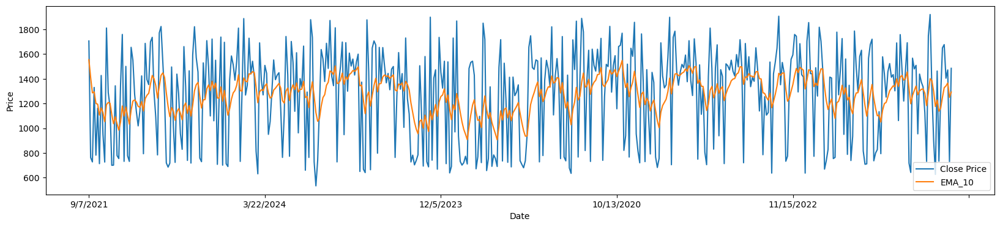

In [121]:
#The plot shows that there is only a small difference between actual and EMA-10 values
#Thus we can proceed with the model development

u.plot.line(use_index=True,figsize=(20,4))
plt.ylabel('Price')
plt.show()

In [123]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(u[["Close Price"]],u[["EMA_10"]],test_size=0.2)

In [125]:
#build the model

from sklearn.linear_model import LinearRegression

#set the model
model = LinearRegression()

#train the model
model.fit(x_train,y_train)

#test model with 617 samples
y_pred = model.predict(x_test)

In [127]:
#Now, we have developed our model and we need to determine how well it's performed
#We evaluate our model using coefficient of determination (r2_score) and mean absolute error
#We can conclude that our LR model fits our data very well
from sklearn.metrics import r2_score,mean_absolute_error

#evaluation metrics
#lower MAE is better
#closer model correlation coefficient to 1.0 the better
print("Model coefficient: ", model.coef_)
print("Model mean absolute error: ", mean_absolute_error(y_test,y_pred))
print("Model R squared error: ", r2_score(y_test,y_pred))

Model coefficient:  [[0.1998137]]
Model mean absolute error:  78.98317260404572
Model R squared error:  0.3695871971710404


In [129]:
##### Data Visualization #####

#convert array to dataframe
y_pred = pd.DataFrame(y_pred)

#adding column name
y_pred.columns = ["Predicted"]

#combine dataframe y_pred to y_test
y_test['Predicted'] = y_pred['Predicted'].values

y_test

,EMA_10,Predicted
Date,,
12/27/2019,1242.171934,1167.847631
4/23/2020,1115.845475,1156.328371
3/23/2023,1362.888616,1295.248847
9/20/2023,1454.498198,1318.367292
7/22/2019,999.589007,1177.328791
...,...,...
10/30/2023,1460.938463,1295.748381
9/20/2021,1347.712416,1357.850479
5/12/2023,1244.971465,1269.402945


<Figure size 640x480 with 0 Axes>

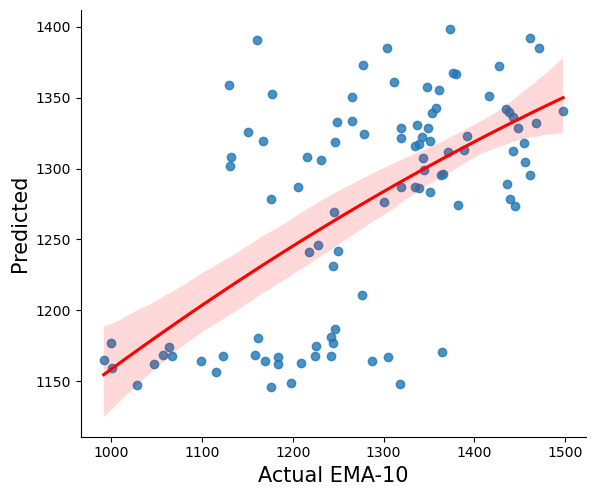

In [139]:
plt.figure(figure = (15,4))
sns.lmplot(x='EMA_10',y='Predicted',data=y_test,order=2, line_kws={'color':'red'} ,height=5,aspect=1.2)
plt.xlabel("Actual EMA-10",fontsize=15)
plt.ylabel("Predicted",fontsize=15)
plt.show()

<Figure size 1800x400 with 0 Axes>

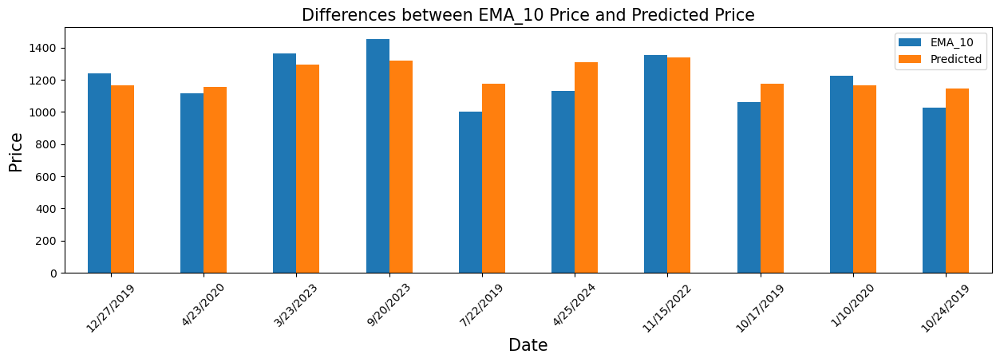

In [145]:
plt.figure(figsize = (18,4))
y_test.head(10).plot(kind='bar',figsize=(15,4))
plt.title('Differences between EMA_10 Price and Predicted Price',fontsize=15)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.xticks(rotation=45)
plt.show()

In [147]:
x=u[['Close Price']]

y_predict2 = model.predict(x)

In [149]:
y_predict2 = pd.DataFrame(y_predict2)

y_predict2.columns = ["Predicted"]

u['Predicted'] = y_predict2['Predicted'].values

u.head()

C:\Users\Vishal\AppData\Local\Temp\ipykernel_23832\3329509052.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Close Price,EMA_10,Predicted
Date,,,
9/7/2021,1706.65,1554.865000,1361.606977
2/11/2019,762.80,1410.853182,1173.012815
1/7/2020,727.90,1286.679876,1166.039317
5/11/2021,1330.65,1294.674444,1286.477025
9/26/2019,782.55,1201.560909,1176.959136


In [151]:
h.columns

Index(['Prev Close', 'Open Price', 'High Price', 'Low Price', 'Last Price',
       'Close Price', 'Average Price', 'Total Traded Quantity', 'Turnover ₹',
       'No. of Trades', 'Deliverable Qty', '% Dly Qt to Traded Qty'],
      dtype='object')

In [153]:
df2 = h.iloc[9:].drop(['Prev Close', 'High Price', 'Low Price',
       'Last Price', 'Close Price', 'Average Price', 'Total Traded Quantity',
       'Turnover ₹', 'No. of Trades', 'Deliverable Qty',
       '% Dly Qt to Traded Qty'],axis=1)


In [155]:
df2['Adjusted Close'] = u['EMA_10'].values
df2['Predicted'] =u['Predicted'].values


In [157]:
df2['Diff'] = df2['Open Price'] - df2['Predicted']

In [161]:
df2.head()

,Open Price,Adjusted Close,Predicted,Diff
Date,,,,
9/7/2021,1730.00,1554.865000,1361.606977,368.393023
2/11/2019,766.90,1410.853182,1173.012815,-406.112815
1/7/2020,738.00,1286.679876,1166.039317,-428.039317
5/11/2021,1336.90,1294.674444,1286.477025,50.422975
9/26/2019,787.75,1201.560909,1176.959136,-389.209136


In [163]:
#Change +ve result in Decision column to 'Sell', -ve to 'Buy' and 0 to 'Hold'
df2['Decision'] = df2['Diff'].apply(lambda x: 'Sell' if x > 0 else('Buy' if x < 0 else 'Hold'))

In [165]:
e= df2['Decision'].value_counts()
pd.DataFrame(e)

,count
Decision,
Sell,302
Buy,189


In [167]:
df2.head(10)

,Open Price,Adjusted Close,Predicted,Diff,Decision
Date,,,,,
9/7/2021,1730.00,1554.865000,1361.606977,368.393023,Sell
2/11/2019,766.90,1410.853182,1173.012815,-406.112815,Buy
1/7/2020,738.00,1286.679876,1166.039317,-428.039317,Buy
5/11/2021,1336.90,1294.674444,1286.477025,50.422975,Sell
9/26/2019,787.75,1201.560909,1176.959136,-389.209136,Buy
12/11/2020,1159.70,1194.586198,1253.018221,-93.318221,Buy
6/18/2020,708.20,1107.188708,1163.241925,-455.041925,Buy
5/8/2024,1435.25,1165.390761,1305.789020,129.460980,Sell
8/10/2020,948.90,1126.474259,1210.687688,-261.787688,Buy


df.columns

from sklearn.model_selection import train_test_split 
#split to train and test data
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2,random_state=0)

#values from 0 to 1
#0 model explain None of the variability
#1 model explain Entire of the variability
lm.score(x_train,y_train)*100

#predict the output(predictions) using the test data
predictions = lm.predict(x_test)

from sklearn.metrics import r2_score 
r2_score(y_test, predictions)*100

In [187]:
#load actual and predecited values side by side
dframe=pd.DataFrame({'actual':y_test.flatten(),'Predicted':predictions.flatten()}) 
#flatten toget single axis of data (1 dimension only)

In [189]:
dframe.head(15)

,actual,Predicted
0,788.75,783.702290
1,643.55,692.270239
2,1460.65,1478.875349
3,1011.00,995.613038
4,794.50,789.242114
5,1245.20,1253.489353
6,1495.15,1483.616640
7,802.20,797.427080
8,954.15,953.939587
9,779.50,776.116225


Text(0, 0.5, 'Closing price')

<Figure size 1800x400 with 0 Axes>

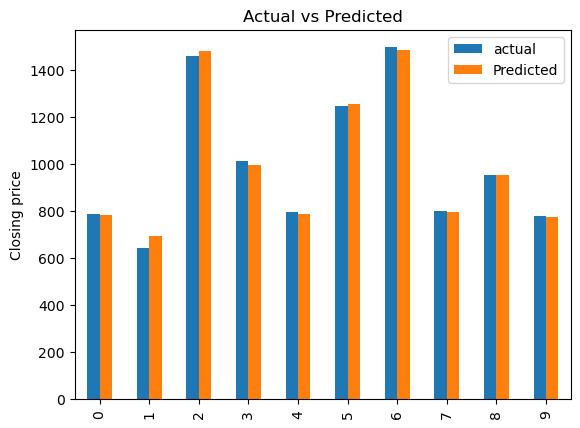

In [195]:
plt.figure(figsize = (18,4))
graph =dframe.head(10)
graph.plot(kind='bar')
plt.title('Actual vs Predicted')
plt.ylabel('Closing price')

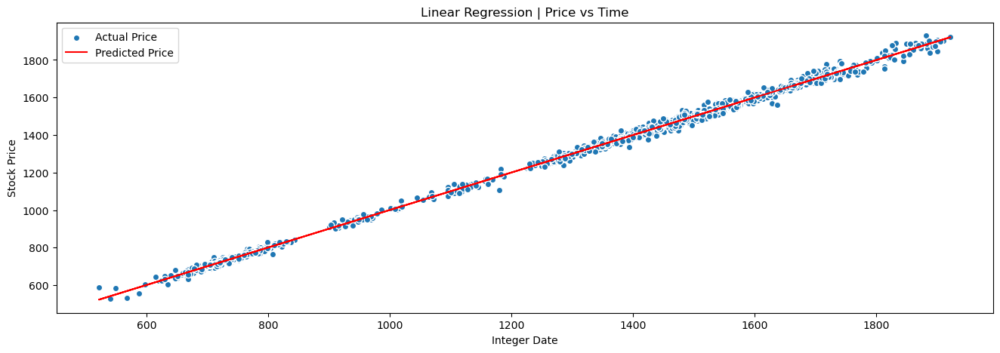

In [193]:
# Train set graph
plt.figure(1, figsize=(16,5))
plt.title('Linear Regression | Price vs Time')
plt.scatter(x_train, y_train, edgecolor='w', label='Actual Price')
plt.plot(x_train,lm.predict(x_train), color='r', label='Predicted Price')
plt.xlabel('Integer Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

Text(0, 0.5, 'Predicted')

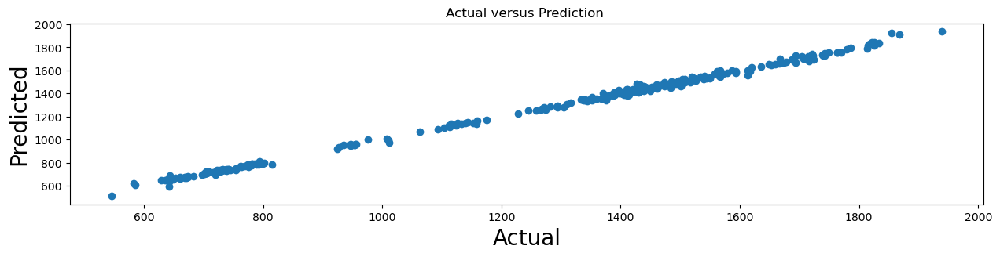

In [199]:
#using scatter plot compare the actual and predicted data
#fig = plt.figure()
plt.figure(figsize = (15,3))
plt.scatter(y_test,predictions)
plt.title('Actual versus Prediction ')
plt.xlabel('Actual', fontsize=20)                         
plt.ylabel('Predicted', fontsize=20) 

In [203]:
import math
from sklearn import metrics

In [205]:
#metrics to find accuracy of continous variables
print('Mean Abs value:' ,metrics.mean_absolute_error(y_test,predictions))
print('Mean squared value:',metrics.mean_squared_error(y_test,predictions))
print('root mean squared error value:',math.sqrt(metrics.mean_squared_error(y_test,predictions)))

Mean Abs value: 11.013943245428358
Mean squared value: 237.49277657539454
root mean squared error value: 15.410800646799457


In [207]:
# Create a new DataFrame with only closing price and date
dfa = pd.DataFrame(df, columns=['Close Price'])


In [209]:
# Reset index column so that we have integers to represent time for later analysis
dfa = dfa.reset_index()

In [211]:
dfa.head(5)

,Date,Close Price
0,1/1/2019,665.05
1,1/2/2019,669.05
2,1/3/2019,669.15
3,1/4/2019,661.05
4,1/7/2019,671.70


In [213]:
# Check for missing values in the columns
dfa.isna().values.any()

False

In [215]:
# Import matplotlib package for date plots
import matplotlib.dates as mdates

years = mdates.YearLocator() # Get every year
yearsFmt = mdates.DateFormatter('%Y') # Set year format

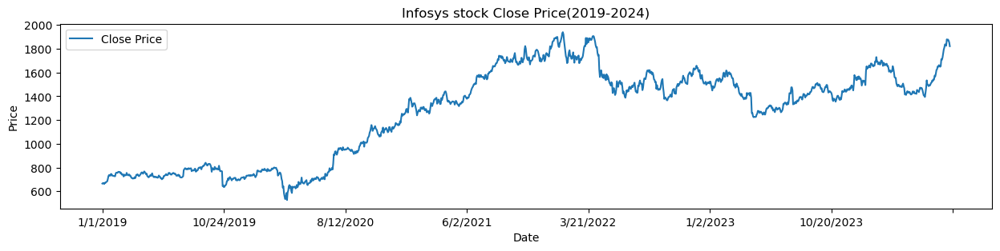

In [217]:
dfa.plot.line(x = 'Date',y="Close Price",figsize=(15,3))
plt.title('Infosys stock Close Price(2019-2024)')
plt.ylabel('Price')
plt.show()

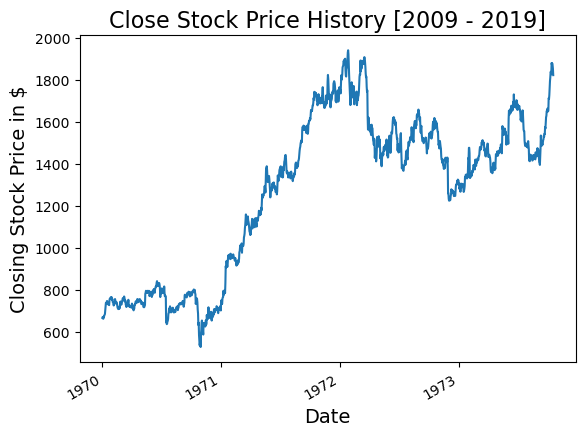

In [219]:
# Import matplotlib package for date plots
import matplotlib.dates as mdates

years = mdates.YearLocator() # Get every year
yearsFmt = mdates.DateFormatter('%Y') # Set year format

# Create subplots to plot graph and control axes
fig, ax = plt.subplots()
ax.plot(dfa['Date'], dfa['Close Price'])

# Format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

# Set figure title
plt.title('Close Stock Price History [2009 - 2019]', fontsize=16)
# Set x label
plt.xlabel('Date', fontsize=14)
# Set y label
plt.ylabel('Closing Stock Price in $', fontsize=14)

# Rotate and align the x labels
fig.autofmt_xdate()

# Show plot
plt.show()

In [221]:
from sklearn.model_selection import train_test_split

In [234]:
# Reshape index column to 2D array for .fit() method
X_train = np.array(dfa.index).reshape(-1, 1)
y_train = dfa['Close Price']

In [236]:
# Create LinearRegression Object
model = LinearRegression()
# Fit linear model using the train data set
model.fit(X_train, y_train)

LinearRegression()

In [238]:
# The coefficient
print('Slope: ', (model.coef_))
# The Intercept
print('Intercept: ', model.intercept_)

Slope:  [0.72992095]
Intercept:  759.310334107266


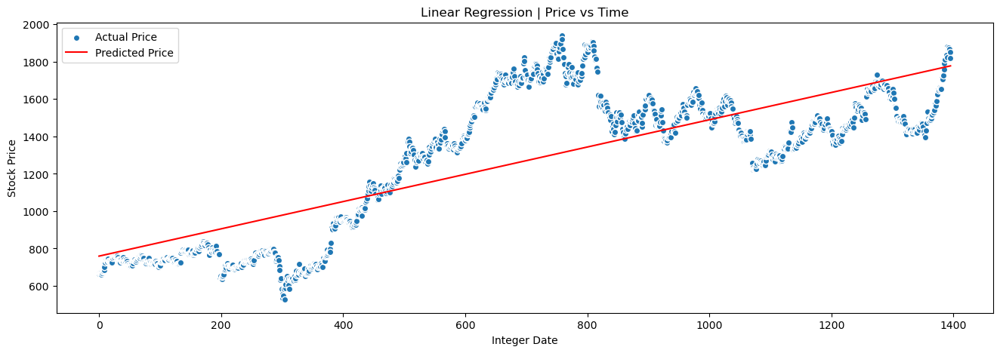

In [240]:
# Train set graph
plt.figure(1, figsize=(16,5))
plt.title('Linear Regression | Price vs Time')
plt.scatter(X_train, y_train, edgecolor='w', label='Actual Price')
plt.plot(X_train, model.predict(X_train), color='r', label='Predicted Price')
plt.xlabel('Integer Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [246]:
# Generate 25 random numbers
randints = np.random.randint(2550, size=25)
dfa_sample = dfa[dfa.index.isin(randints)]

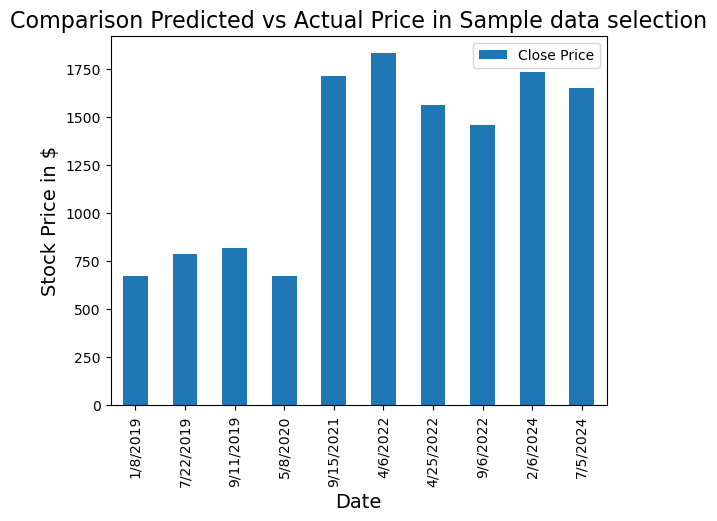

In [248]:
# Create subplots to plot graph and control axes
fig, ax = plt.subplots()

dfa_sample.plot(x='Date', y=['Close Price'], kind='bar', ax=ax)

# Set figure title
plt.title('Comparison Predicted vs Actual Price in Sample data selection', fontsize=16)

# Set x label
plt.xlabel('Date', fontsize=14)

# Set y label
plt.ylabel('Stock Price in $', fontsize=14)

# Show plot
plt.show()

In [262]:
t.head(1)

,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty
Date,,,,,,,,,,,,
1/1/2019,658.95,660.95,666.3,654.15,665.95,665.05,660.66,2943390,1.944579e+09,45422,"12,82,161",43.56


Time wise prediction

I will create the following features:
- `5_day_avg` - The average price from the past 5 days.
- `30_day_avg` - The average price for the past 30 days.
- `year_avg` - The average price for the past 365 days.
- `avg_ratio`- The ratio between the average price for the past 5 days, and the average price for the past 365 days.
- `5_day_std` - The standard deviation of the price over the past 5 days.
- `year_std`- The standard deviation of the price over the past 365 days.
- `std_ratio`- The ratio between the standard deviation for the past 5 days, and the standard deviation for the past 365 days

In [268]:
t =  pd.read_csv("info.csv")
t= t.drop(t.iloc[:,0:3], axis=1) 
t.rename(columns=lambda x: x.strip(), inplace=True)
t.columns

Index(['Date', 'Prev Close', 'Open Price', 'High Price', 'Low Price',
       'Last Price', 'Close Price', 'Average Price', 'Total Traded Quantity',
       'Turnover ₹', 'No. of Trades', 'Deliverable Qty',
       '% Dly Qt to Traded Qty'],
      dtype='object')

In [270]:
# Fromat Date Column as datetime
t['Date'] = pd.to_datetime(t['Date'])

In [272]:
# The rolling mean and standard deviation will use the current day's price. 
# I use .he shift method to reindex the resulting series to shift all the values "forward" one day. 
# For example, the rolling mean calculated for 1950-01-03 will need to be assigned to 1950-01-04, and so on. 
t['5_day_avg'] = t['Close Price'].rolling(window=5).mean().shift(1)
t['30_day_avg']= t['Close Price'].rolling(window=30).mean().shift(1)
t['year_avg'] = t['Close Price'].rolling(window=365).mean().shift(1)
t['avg_ratio'] = t['5_day_avg']/t['year_avg']

t['5_day_std'] = t['Close Price'].rolling(window=5).std().shift(1)
t['year_std'] = t['Close Price'].rolling(window=365).mean().shift(1)
t['std_ratio'] = t['5_day_std']/t['year_std']

In [274]:
t = t.dropna(axis=0)
t.isnull().sum()

Date                      0
Prev Close                0
Open Price                0
High Price                0
Low Price                 0
Last Price                0
Close Price               0
Average Price             0
Total Traded Quantity     0
Turnover ₹                0
No. of Trades             0
Deliverable Qty           0
% Dly Qt to Traded Qty    0
5_day_avg                 0
30_day_avg                0
year_avg                  0
avg_ratio                 0
5_day_std                 0
year_std                  0
std_ratio                 0
dtype: int64

In [276]:
train = t[t['Date']< datetime(year=2022, month=1, day=1)] 
train.head(2)

,Date,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty,5_day_avg,30_day_avg,year_avg,avg_ratio,5_day_std,year_std,std_ratio
365,2020-06-04,701.55,702.0,709.45,697.5,707.05,707.75,704.17,10783594,7.593496e+09,134508,"59,36,764",55.05,701.52,701.52,731.692466,0.958763,6.935831,731.692466,0.009479
366,2020-06-05,707.75,707.0,711.70,700.6,704.75,703.55,705.80,7718943,5.448031e+09,124734,"31,91,258",41.34,701.59,701.59,731.809452,0.958706,7.011366,731.809452,0.009581


In [278]:
test = t[t["Date"] > datetime(year=2022, month=1, day=1)]
test.head(2)

,Date,Prev Close,Open Price,High Price,Low Price,Last Price,Close Price,Average Price,Total Traded Quantity,Turnover ₹,No. of Trades,Deliverable Qty,% Dly Qt to Traded Qty,5_day_avg,30_day_avg,year_avg,avg_ratio,5_day_std,year_std,std_ratio
762,2022-01-03,1887.75,1887.75,1914.05,1887.75,1899.0,1898.45,1904.82,3329616,6.342326e+09,128107,"19,73,673",59.28,1884.06,1884.06,1382.598356,1.362695,10.360888,1382.598356,0.007494
763,2022-01-04,1898.45,1898.45,1906.65,1878.00,1901.0,1899.15,1888.87,3921999,7.408140e+09,120603,"23,72,696",60.5,1890.52,1890.52,1385.239863,1.364760,5.172959,1385.239863,0.003734


In [280]:
features = ['5_day_avg', '30_day_avg', 'year_avg', 'avg_ratio', '5_day_std',
       'year_std', 'std_ratio']
y_train = train['Close Price']
y_test = test['Close Price']

model = LinearRegression()
model.fit(train[features], y_train) 
predictions = model.predict(test[features]) 
mae = mean_absolute_error(test['Close Price'], predictions)
mae

56.418753390834546

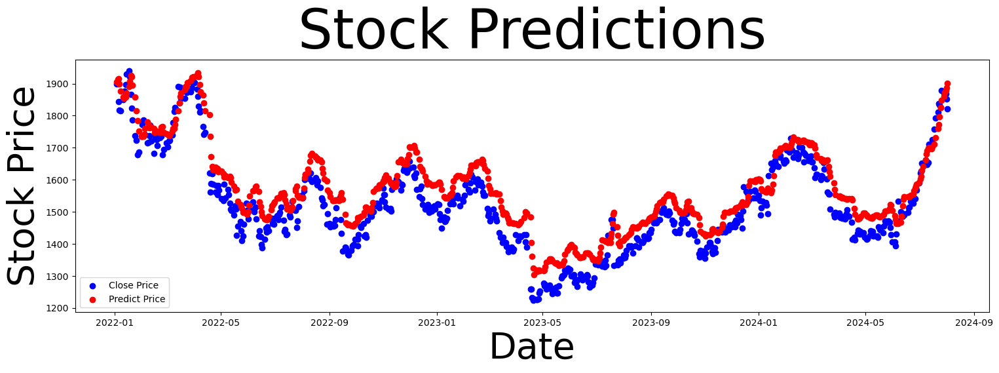

In [284]:
plt.figure(figsize=(18,5))
plt.scatter(test['Date'], test['Close Price'], c='b',label = 'Close Price')
plt.scatter(test['Date'], predictions, c='r',label = 'Predict Price')
plt.title('Stock Predictions', fontsize=60)
plt.xlabel('Date', fontsize=40)
plt.ylabel('Stock Price', fontsize=40)
plt.legend()
plt.show()

LSTM

A Long Short-Term Memory network (LSTM) is a type of deep neural network that is designed to capture historical information of time series data and is suitable for predicting long-term nonlinear series.

<Figure size 1500x300 with 0 Axes>

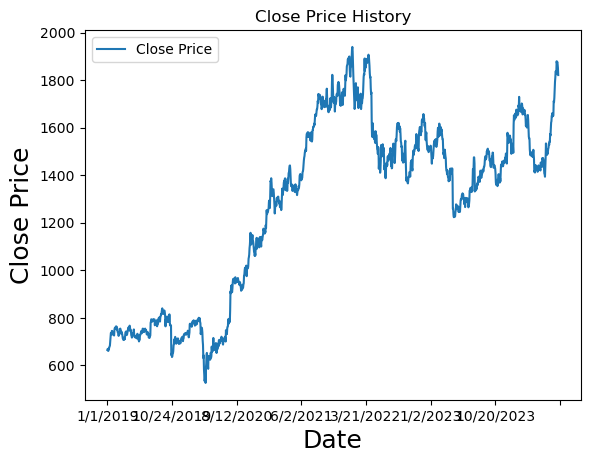

In [293]:
plt.figure(figsize=(15,3))
df.plot.line(y = 'Close Price',use_index =True)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price', fontsize=18)
plt.title('Close Price History')
plt.show()

In [295]:
# Create a new dataframe with only the 'Close column 
data = df.filter(['Close Price'])         #Subset the DataFrame or Series according to the specified index labels.
# Convert the dataframe to a numpy array
dataset = data.values
# Get the number of rows to train the model on
training_data_len = int(np.ceil( len(dataset) * .95 ))

training_data_len

1327

In [297]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler      #Standardizes features by scaling each feature to a given range

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.0980857 ],
       [0.10091646],
       [0.10098723],
       ...,
       [0.94957716],
       [0.93850182],
       [0.91628039]])

In [299]:
# Create the training data set 
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]
# Split the data into x_train and y_train data sets
x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()
        
# Convert the x_train and y_train to numpy arrays 
x_train, y_train = np.array(x_train), np.array(y_train)

# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
# x_train.shape

[array([0.0980857 , 0.10091646, 0.10098723, 0.09525494, 0.10279183,
       0.10162415, 0.10590567, 0.10845335, 0.11114256, 0.12416404,
       0.14164396, 0.14886239, 0.14642086, 0.14472241, 0.15466544,
       0.15491313, 0.14521779, 0.14546548, 0.1442978 , 0.14259934,
       0.14256396, 0.14114858, 0.15788543, 0.16319309, 0.16237925,
       0.16163618, 0.16761615, 0.16811153, 0.1659177 , 0.1672623 ,
       0.15852235, 0.16167156, 0.15116238, 0.15250699, 0.15187007,
       0.14001628, 0.15162238, 0.14649163, 0.14755317, 0.14755317,
       0.16167156, 0.15289622, 0.14776547, 0.14709317, 0.1524716 ,
       0.14581933, 0.14581933, 0.1390609 , 0.13155939, 0.13078093,
       0.12773787, 0.12879941, 0.12872864, 0.13594706, 0.13003786,
       0.13856551, 0.15038392, 0.15038392, 0.15332083, 0.14776547])]
[0.14245780404090436]

[array([0.0980857 , 0.10091646, 0.10098723, 0.09525494, 0.10279183,
       0.10162415, 0.10590567, 0.10845335, 0.11114256, 0.12416404,
       0.14164396, 0.14886239, 0.14

In [301]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

C:\Users\Vishal\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



1267/1267 ━━━━━━━━━━━━━━━━━━━━ 28s 18ms/step - loss: 0.0059


In [303]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002 
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])
    
# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 235ms/step


37.21823712251959

In [305]:
# Plot the data
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

C:\Users\Vishal\AppData\Local\Temp\ipykernel_23832\1606462354.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



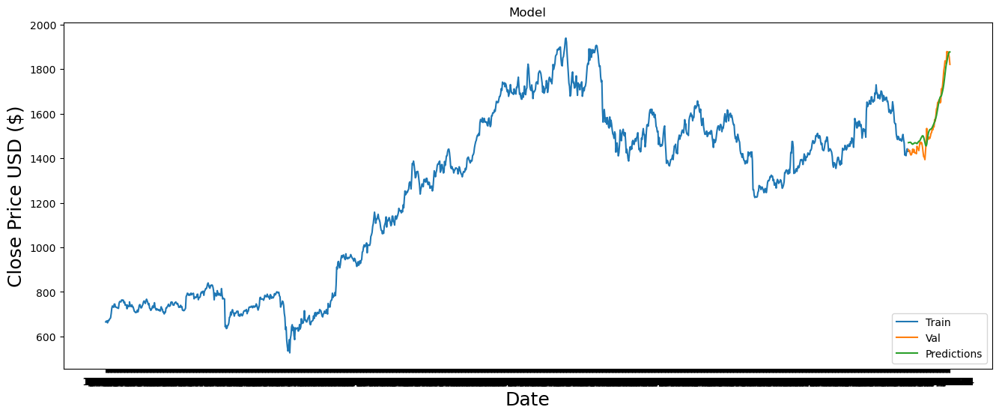

In [307]:
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close Price'])
plt.plot(valid[['Close Price', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [ ]:
Arima 

ARIMA is an acronym for “autoregressive integrated moving average.” It’s a model used in statistics and econometrics to measure events that happen over a period of time. The model is used to understand past data or predict future data in a series. It’s used when a metric is recorded in regular intervals, from fractions of a second to daily, weekly or monthly periods. 

In [430]:
df = pd.read_csv("info.csv")

In [432]:
df= df.drop(df.iloc[:,0:3], axis=1)

In [434]:
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

In [436]:
df.rename(columns=lambda x: x.strip(), inplace=True)
df.columns

Index(['Date', 'Prev Close', 'Open Price', 'High Price', 'Low Price',
       'Last Price', 'Close Price', 'Average Price', 'Total Traded Quantity',
       'Turnover ₹', 'No. of Trades', 'Deliverable Qty',
       '% Dly Qt to Traded Qty'],
      dtype='object')

In [376]:
plt.style.use('fivethirtyeight')

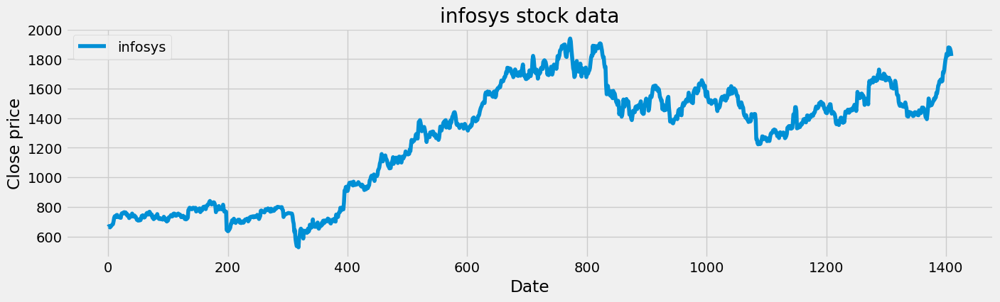

In [438]:
plt.figure(figsize = (15,4))
plt.plot(df.index,df['Close Price'],label = 'infosys')
plt.title('infosys stock data')
plt.xlabel('Date')
plt.ylabel('Close price')
plt.legend(loc = 'upper left')
plt.show()

In [440]:
SMA30 = pd.DataFrame()
SMA30['Close Price'] = df['Close Price'].rolling(window = 30).mean()

In [442]:
SMA100 = pd.DataFrame()
SMA100['Close Price'] = df['Close Price'].rolling(window = 100).mean()
SMA100

,Close Price
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
1405,1539.5395
1406,1541.7640
1407,1543.8835
1408,1546.0375


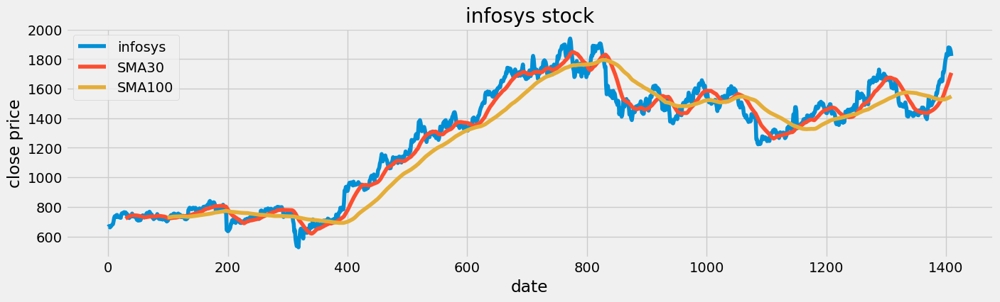

In [444]:
plt.figure(figsize = (15,4))
plt.plot(df['Close Price'],label=  'infosys') #seasonal moving average (SMA)
plt.plot(SMA30['Close Price'],label = 'SMA30')
plt.plot(SMA100['Close Price'],label = 'SMA100')
plt.title('infosys stock')
plt.xlabel('date')
plt.ylabel('close price')
plt.legend(loc = 'upper left')
plt.show()

In [446]:
data  = pd.DataFrame()
data['info'] = df['Close Price']
data['SMA30'] = SMA30['Close Price']
data['SMA100'] = SMA100['Close Price']

In [448]:
data

,info,SMA30,SMA100
0,665.05,NaN,NaN
1,669.05,NaN,NaN
2,669.15,NaN,NaN
3,661.05,NaN,NaN
4,671.70,NaN,NaN
...,...,...,...
1405,1871.10,1660.198333,1539.5395
1406,1877.15,1673.140000,1541.7640
1407,1868.25,1685.475000,1543.8835
1408,1852.60,1696.850000,1546.0375


In [461]:
#create a fun to siga whe to buy and sell stock
def buy_sell(data):
    sigPriceBuy = []
    sigPriceSell = []
    flag = -1

    # Use data.index to iterate over the actual index values
    for i in data.index:
        if data['SMA30'][i] > data['SMA100'][i]:
            if flag != 1:
                sigPriceBuy.append(data['info'][i])
                sigPriceSell.append(np.nan)
                flag  = 1
            else:
                sigPriceBuy.append(np.nan)
                sigPriceSell.append(np.nan)
        elif data['SMA30'][i] < data['SMA100'][i]:
            if flag != 0:
                sigPriceBuy.append(np.nan)
                sigPriceSell.append(data['info'][i])
                flag = 0
            else:
                sigPriceBuy.append(np.nan)
                sigPriceSell.append(np.nan)
        else:
            sigPriceBuy.append(np.nan)
            sigPriceSell.append(np.nan)
    return (sigPriceBuy, sigPriceSell)

In [463]:
buy_sell = buy_sell(data)

In [465]:
data['Price_Signal_Buy'] = buy_sell[0]
data['Price_Signal_Sell'] = buy_sell[1]

In [467]:
data.head()

,info,SMA30,SMA100,Price_Signal_Buy,Price_Signal_Sell
0,665.05,NaN,NaN,NaN,NaN
1,669.05,NaN,NaN,NaN,NaN
2,669.15,NaN,NaN,NaN,NaN
3,661.05,NaN,NaN,NaN,NaN
4,671.70,NaN,NaN,NaN,NaN


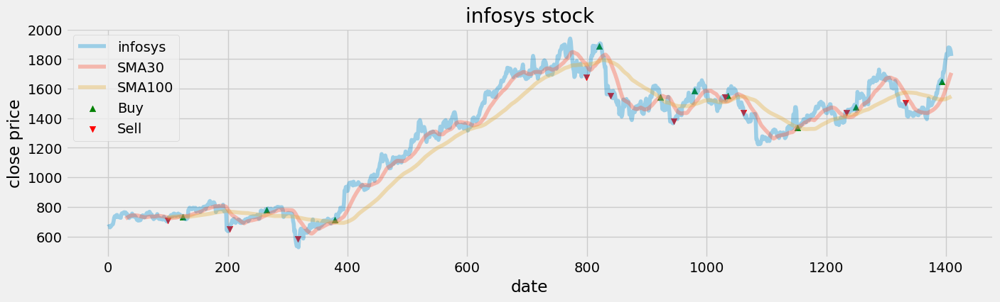

In [469]:
plt.figure(figsize = (15,4))
plt.plot(data['info'],label=  'infosys',alpha = 0.35)    
plt.plot(data['SMA30'],label = 'SMA30',alpha = 0.35)   #Simple Moving Average
plt.plot(data['SMA100'],label = 'SMA100',alpha = 0.35)
plt.scatter(data.index,data['Price_Signal_Buy'],label = 'Buy',marker = '^',color = 'green')
plt.scatter(data.index,data['Price_Signal_Sell'],label = 'Sell',marker = 'v',color = 'red')
plt.title('infosys stock')
plt.xlabel('date')
plt.ylabel('close price')
plt.legend(loc = 'upper left')
plt.show()

!pip install pmdarima

In [473]:
import math # imports the math module
from pmdarima import auto_arima
from sklearn.linear_model import LinearRegression
import datetime as dt

In [475]:
def auto_arima_prediction(df):
    shape=df.shape[0]
    df_new=df
    data = df_new.sort_index(ascending=True, axis=0)
    train_set=data[:math.ceil(shape*0.75)] # use math.ceil to call the ceil function from the math module
    valid_set=data[math.ceil(shape*0.75):] # use math.ceil to call the ceil function from the math module
    print('----------------------------------------------------------')
    print('-----------STOCK PRICE PREDICTION BY AUTO ARIMA-----------')
    print('----------------------------------------------------------')
    print('Shape of Training Set',train_set.shape)
    print('Shape of Validation Set',valid_set.shape)
    training = train_set['Close Price']
    validation = valid_set['Close Price']
    model = auto_arima(training, start_p=1, start_q=1,max_p=3, max_q=3, m=12,start_P=0, seasonal=True,d=1, D=1, trace=True,error_action='ignore',suppress_warnings=True)
    model.fit(training)
    forecast = model.predict(n_periods=math.ceil(math.floor(df.shape[0]*0.25))) # use math.ceil and math.floor to call the functions from the math module
    forecast = pd.DataFrame(forecast,index = valid_set.index,columns=['Prediction'])
    rms=np.sqrt(np.mean(np.power((np.array(valid_set['Close Price'])-np.array(forecast['Prediction'])),2)))
    print('RMSE value on validation set:',rms)
    print('-----------------------------------------------------------')
    print('-----------------------------------------------------------')
    plt.plot(train_set['Close Price'])
    plt.plot(valid_set['Close Price'])
    plt.plot(forecast['Prediction'])
    plt.xlabel('Date',size=20)
    plt.ylabel('Stock Price',size=20)
    plt.title('Stock Price Prediction by Auto ARIMA',size=20)
    plt.legend(['Model Training Data','Actual Data','Predicted Data'])

----------------------------------------------------------
-----------STOCK PRICE PREDICTION BY AUTO ARIMA-----------
----------------------------------------------------------
Shape of Training Set (1047, 13)
Shape of Validation Set (349, 13)
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=5.79 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=9883.167, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=9649.698, Time=0.62 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=3.03 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=9884.885, Time=0.20 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=9513.205, Time=1.83 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=5.09 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=9511.462, Time=1.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=9648.131, Time=0.43 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=5.20 sec
 

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



RMSE value on validation set: nan
-----------------------------------------------------------
-----------------------------------------------------------


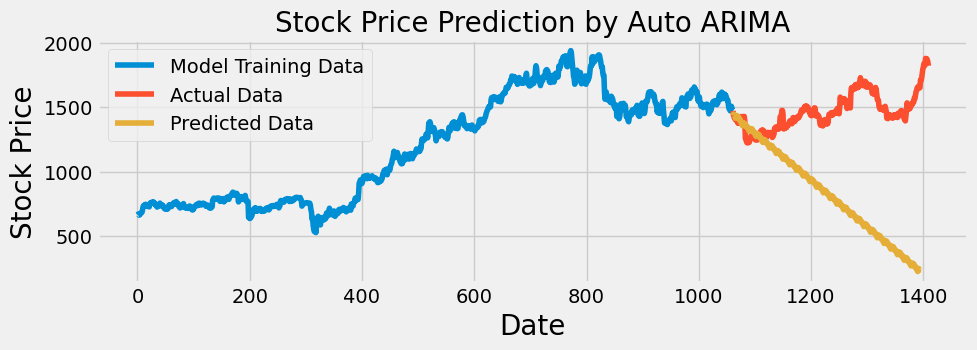

In [477]:
auto_arima_prediction(df)

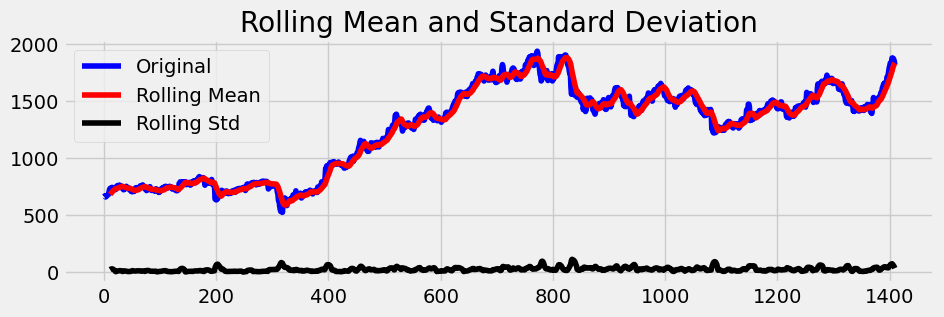

Results of dickey fuller test
Test Statistics                  -1.174941
p-value                           0.684281
No. of lags used                  1.000000
Number of observations used    1394.000000
critical value (1%)              -3.435050
critical value (5%)              -2.863616
critical value (10%)             -2.567875
dtype: float64


In [479]:
#Test for staionarity
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    #Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)
    
test_stationarity(df['Close Price'])

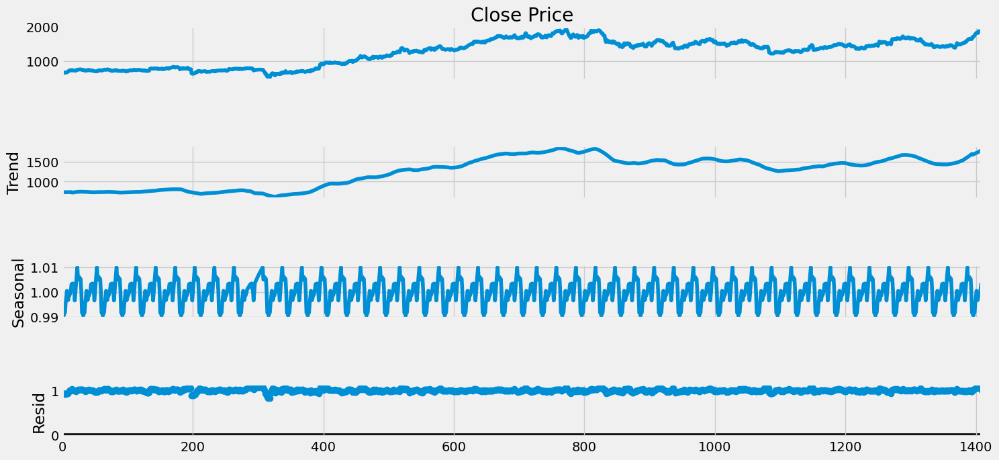

In [483]:
#To separate the trend and the seasonality from a time series, 
# we can decompose the series using the following code.
result = seasonal_decompose(df['Close Price'], model='multiplicative',extrapolate_trend='freq', period=30)
fig = result.plot()  
fig.set_size_inches(16, 9)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


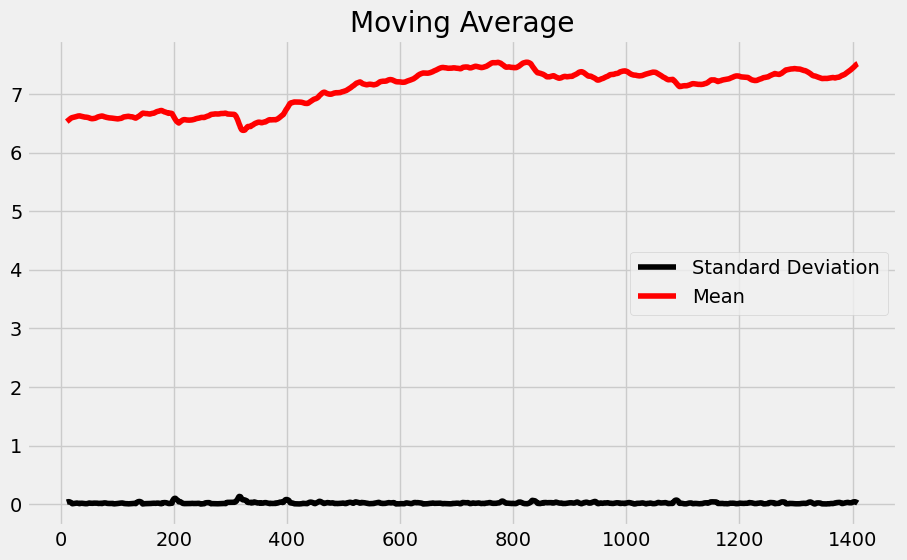

In [485]:
#if not stationary then eliminate trend
#Eliminate trend
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
df_log = np.log(df['Close Price'])
moving_avg = df_log.rolling(12).mean()
std_dev = df_log.rolling(12).std()
plt.legend(loc='best')
plt.title('Moving Average')
plt.plot(std_dev, color ="black", label = "Standard Deviation")
plt.plot(moving_avg, color="red", label = "Mean")
plt.legend()
plt.show()

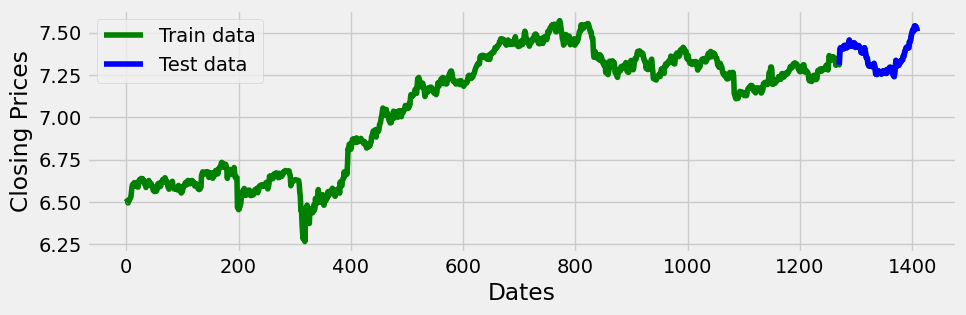

In [509]:
#split data into train and training set
train_data, test_data = df_log[3:int(len(df_log)*0.9)], df_log[int(len(df_log)*0.9):]
plt.figure(figsize=(10,3))
plt.grid(True)
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(df_log, 'green', label='Train data')
plt.plot(test_data, 'blue', label='Test data')
plt.legend()

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6481.926, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-6480.325, Time=1.22 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-6480.310, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6482.246, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-6477.840, Time=0.65 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 3.526 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1253
Model:               SARIMAX(0, 1, 0)   Log Likelihood                3242.123
Date:                Tue, 10 Sep 2024   AIC                          -6482.246
Time:                        18:52:07   BIC                          -6477.113
Sample:                             0   HQIC                         -6480.317
                               - 1253                                  

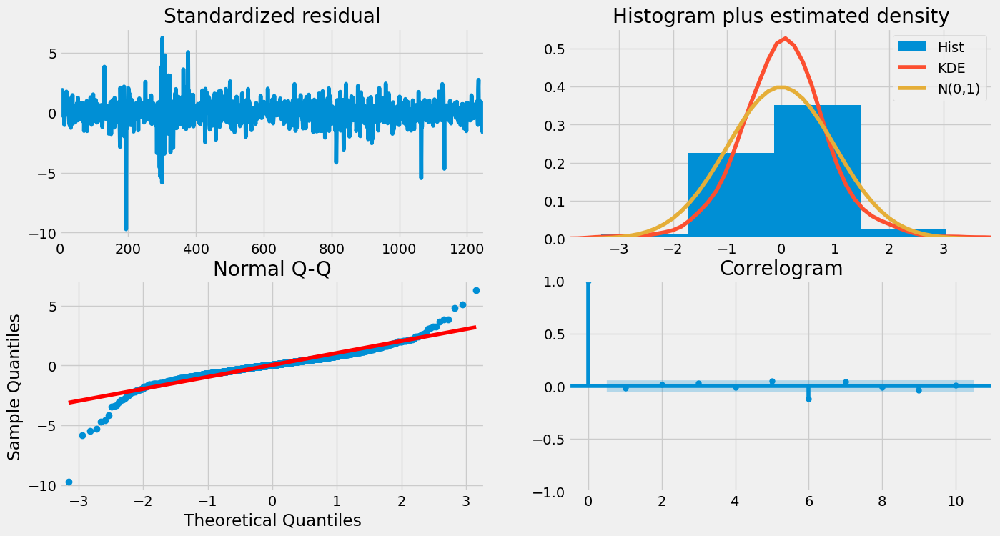

In [489]:
model_autoARIMA = auto_arima(train_data, start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)
print(model_autoARIMA.summary())
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [491]:
import statsmodels.api as sm

In [493]:
model = sm.tsa.arima.ARIMA(train_data, order=(1,1,2))
result = model.fit()

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



In [495]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:            Close Price   No. Observations:                 1253
Model:                 ARIMA(1, 1, 2)   Log Likelihood                3242.405
Date:                Tue, 10 Sep 2024   AIC                          -6476.810
Time:                        18:55:02   BIC                          -6456.280
Sample:                             0   HQIC                         -6469.092
                               - 1253                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2251      1.321     -0.170      0.865      -2.814       2.364
ma.L1          0.2087      1.317      0.158      0.874      -2.372       2.790
ma.L2          0.0140      0.034      0.406      0.684      -0.053       0.081
sigma2         0.0003   5.08e-06     64.927      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              8126.49
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               0.47   Skew:                            -0.89
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [497]:
# Forecast
fc = result.forecast(321, alpha=0.05)  # 95% conf

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [499]:
se =result.forecast(321, alpha=0.05)  # 95% conf
conf= result.forecast(321, alpha=0.05)  # 95% conf

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\Vishal\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



Text(0.5, 1.0, 'Stock Price of Infosys over the Years')

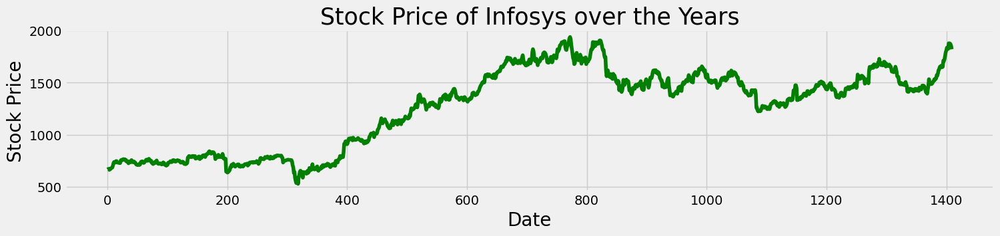

In [543]:
plt.figure(figsize=(16,3))
plt.plot(df['Close Price'], label='Close Price history',color='g')
plt.xlabel('Date',size=20)
plt.ylabel('Stock Price',size=20)
plt.title('Stock Price of Infosys over the Years',size=25)

In [505]:
import math # imports the math module
def moving_avg_prediction(df):
    shape=df.shape[0]
    df_new=df[['Close Price']]
    df_new.head()
    train_set=df_new.iloc[:math.ceil(shape*0.75)] # use math.ceil
    valid_set=df_new.iloc[math.ceil(shape*0.75):] # use math.ceil
    print('-----------------------------------------------------------')
    print('-----------STOCK PRICE PREDICTION BY MOVING AVERAGE--------')
    print('-----------------------------------------------------------')
    print('Shape of Training Set',train_set.shape)
    print('Shape of Validation Set',valid_set.shape)
    preds = []
    for i in range(0,valid_set.shape[0]):
        a = train_set['Close Price'][len(train_set)-valid_set.shape[0]+i:].sum() + sum(preds)
        b = a/(valid_set.shape[0])
        preds.append(b)
    rms=np.sqrt(np.mean(np.power((np.array(valid_set['Close Price'])-preds),2)))
    print('RMSE value on validation set:',rms)
    print('-----------------------------------------------------------')
    print('-----------------------------------------------------------')
    valid_set['Predictions'] = preds
    plt.plot(train_set['Close Price'])
    plt.plot(valid_set[['Close Price', 'Predictions']])
    plt.xlabel('Date',size=20)
    plt.ylabel('Stock Price',size=20)
    plt.title('Stock Price Prediction by Moving Averages',size=20)
    plt.legend(['Model Training Data','Actual Data','Predicted Data'])

-----------------------------------------------------------
-----------STOCK PRICE PREDICTION BY MOVING AVERAGE--------
-----------------------------------------------------------
Shape of Training Set (1047, 1)
Shape of Validation Set (349, 1)
RMSE value on validation set: 173.1057958513777
-----------------------------------------------------------
-----------------------------------------------------------


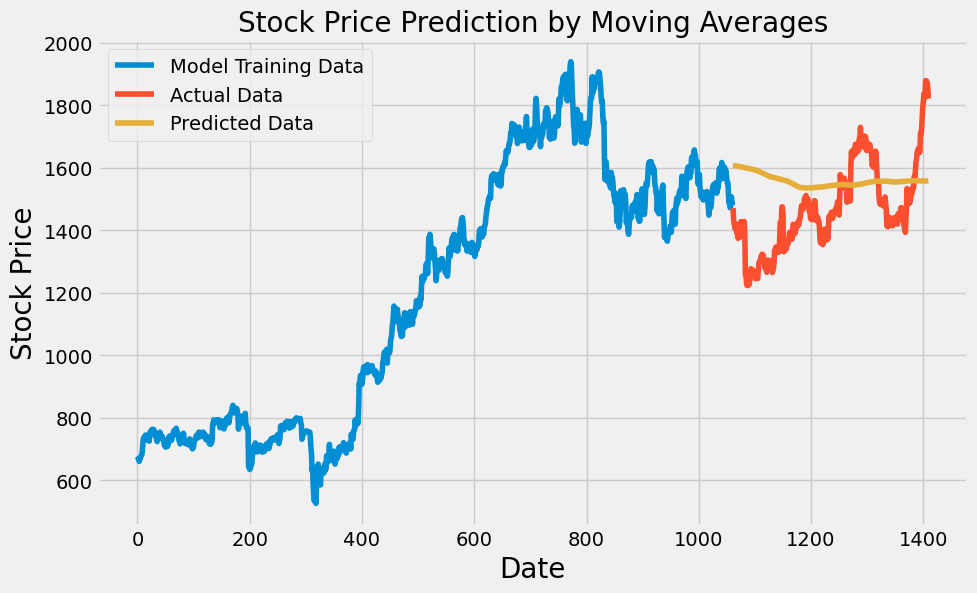

In [507]:
moving_avg_prediction(df)